In [12]:
%matplotlib inline

In [13]:
import matplotlib.pyplot as plt
import numpy as np

In [14]:
import sys
if sys.version[0] == '3':
    from imp import reload

import warnings
warnings.filterwarnings("ignore") ## hmm throws warnings about old functions used internally...

In [15]:
import build_markov
reload(build_markov)

<module 'build_markov' from '/Users/gil/Documents/repos/diffusion_maps/build_markov.py'>

In [16]:
hand_picked_indices = np.asarray(range(100000)[::40])

In [17]:
model = build_markov.dim_red_builder(num_sample_points = 2500,
                                     Regime= "kerr_bistable_cascade", 
                                     name = 'kerr_bistable_cascade',
                                     sample_type = 'hand_picked',
                                     hand_picked_indices = hand_picked_indices,
                                    )

In [18]:
model.run_diffusion_map(eig_upper_bound = 7,eps = 0.5,)  

In [19]:
model.save()

In [20]:
model.load()

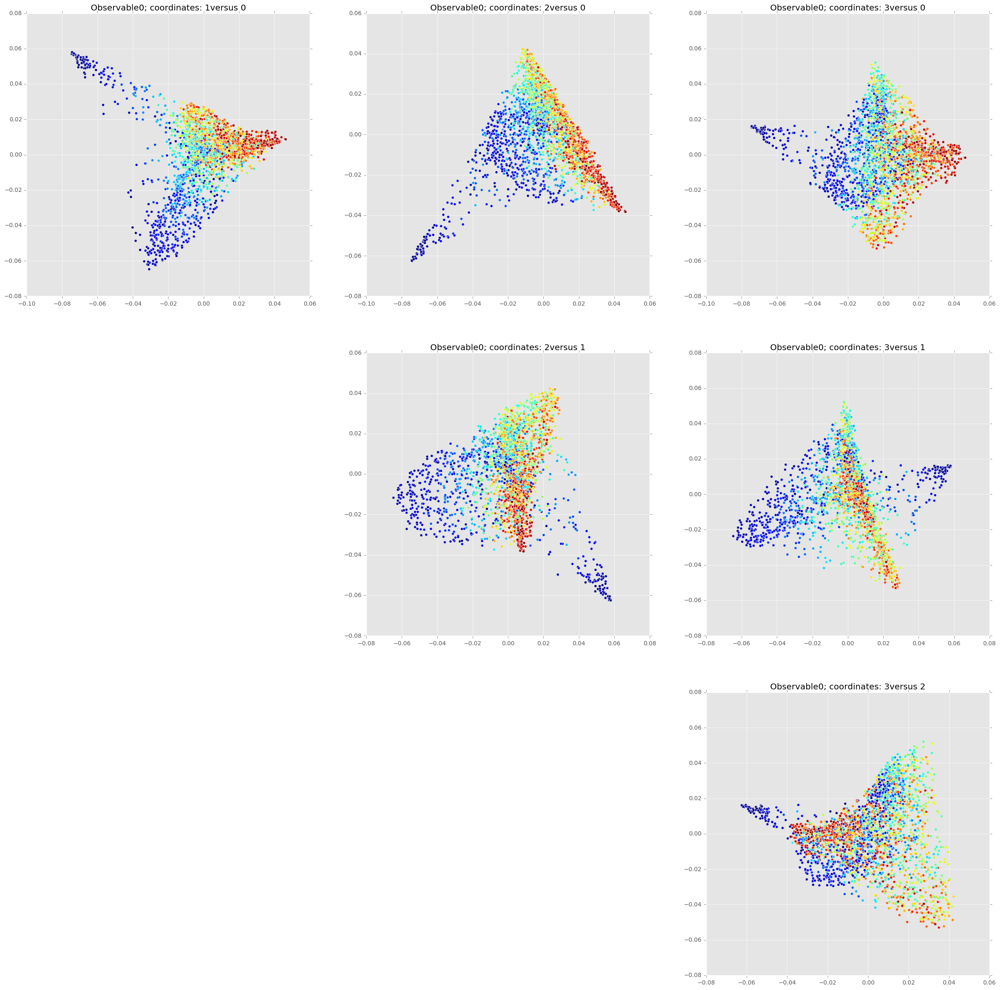

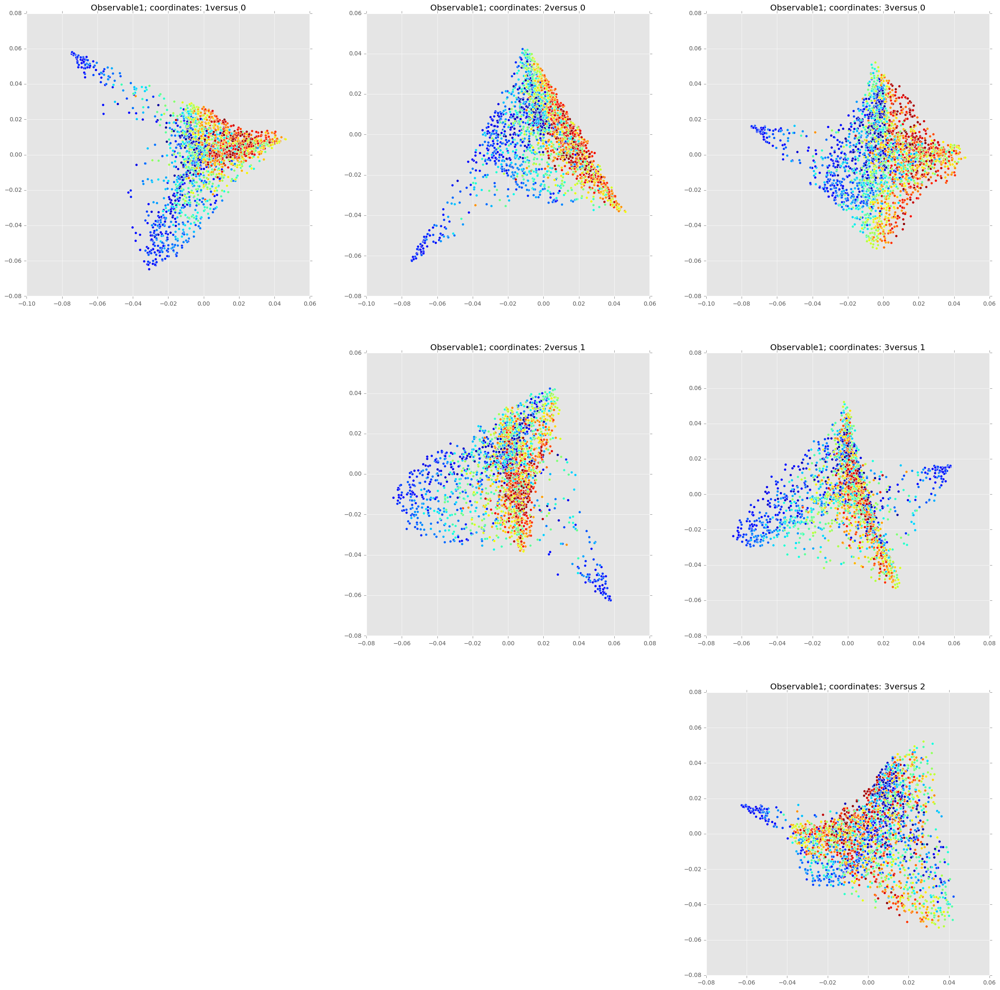

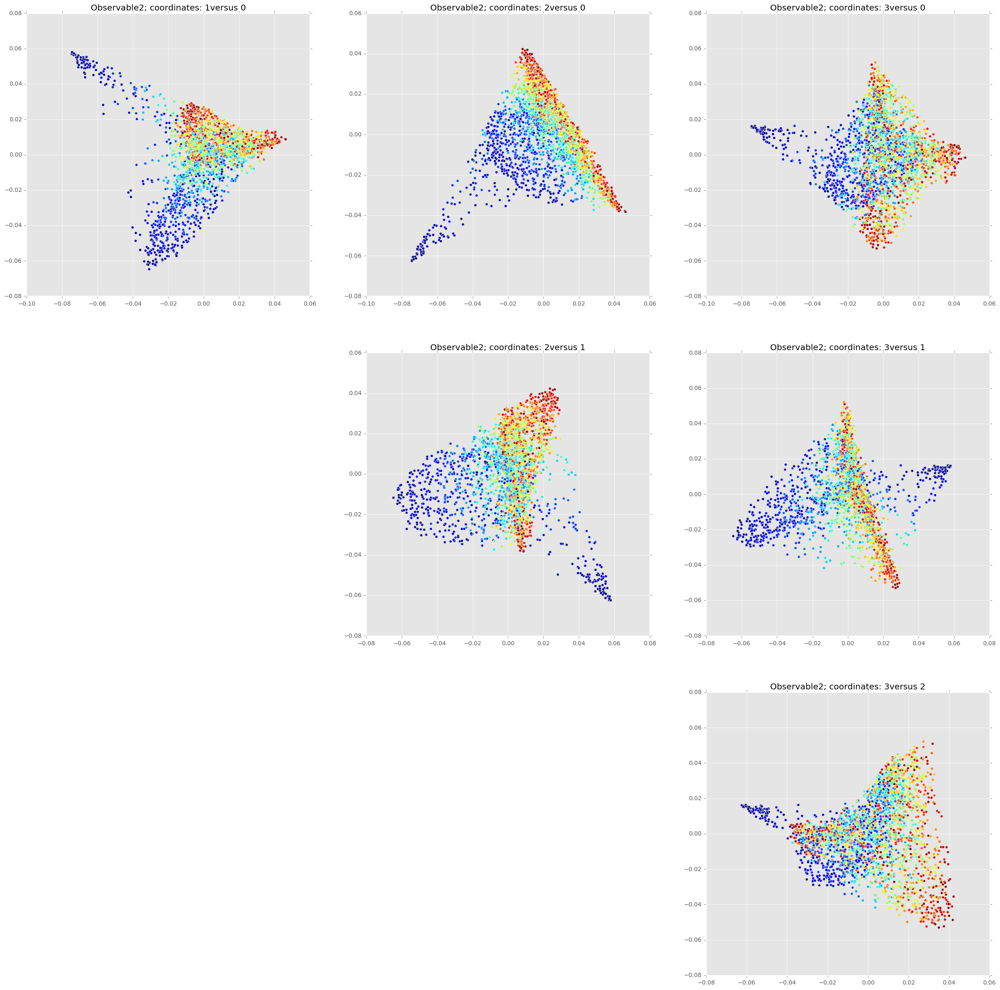

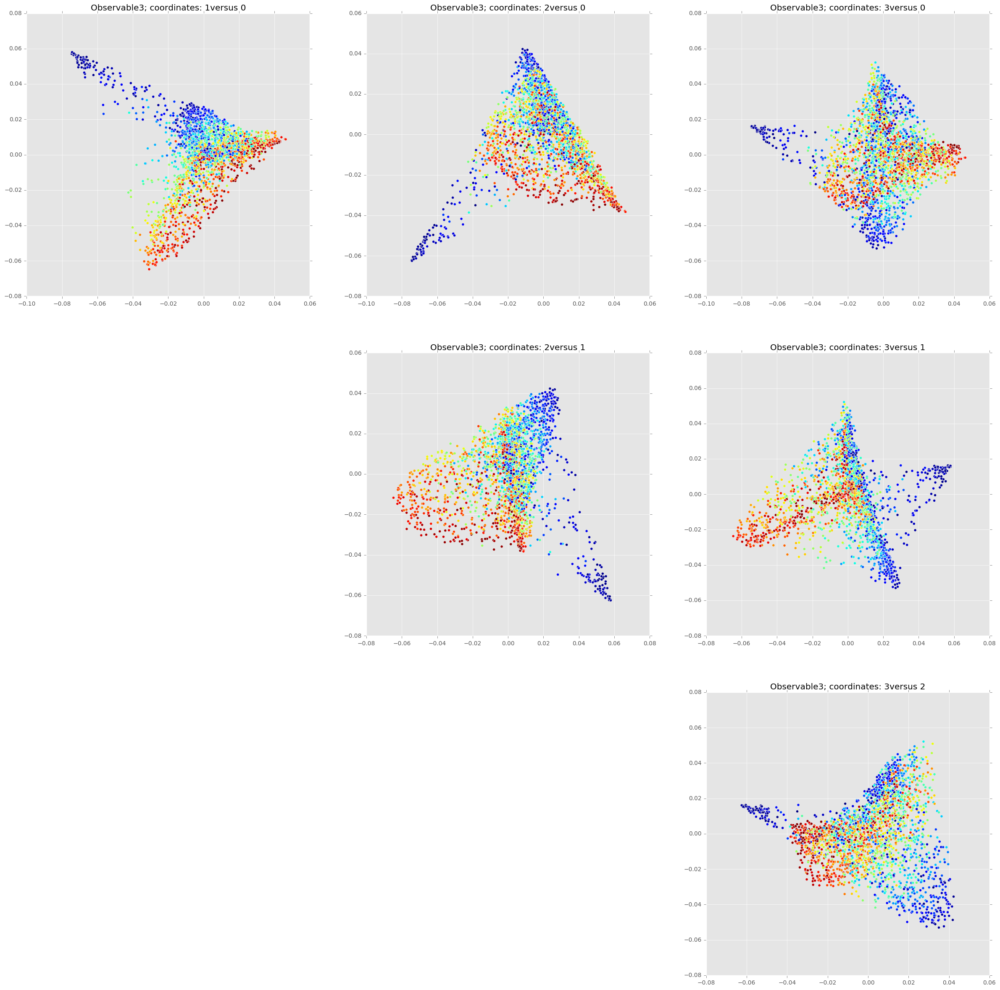

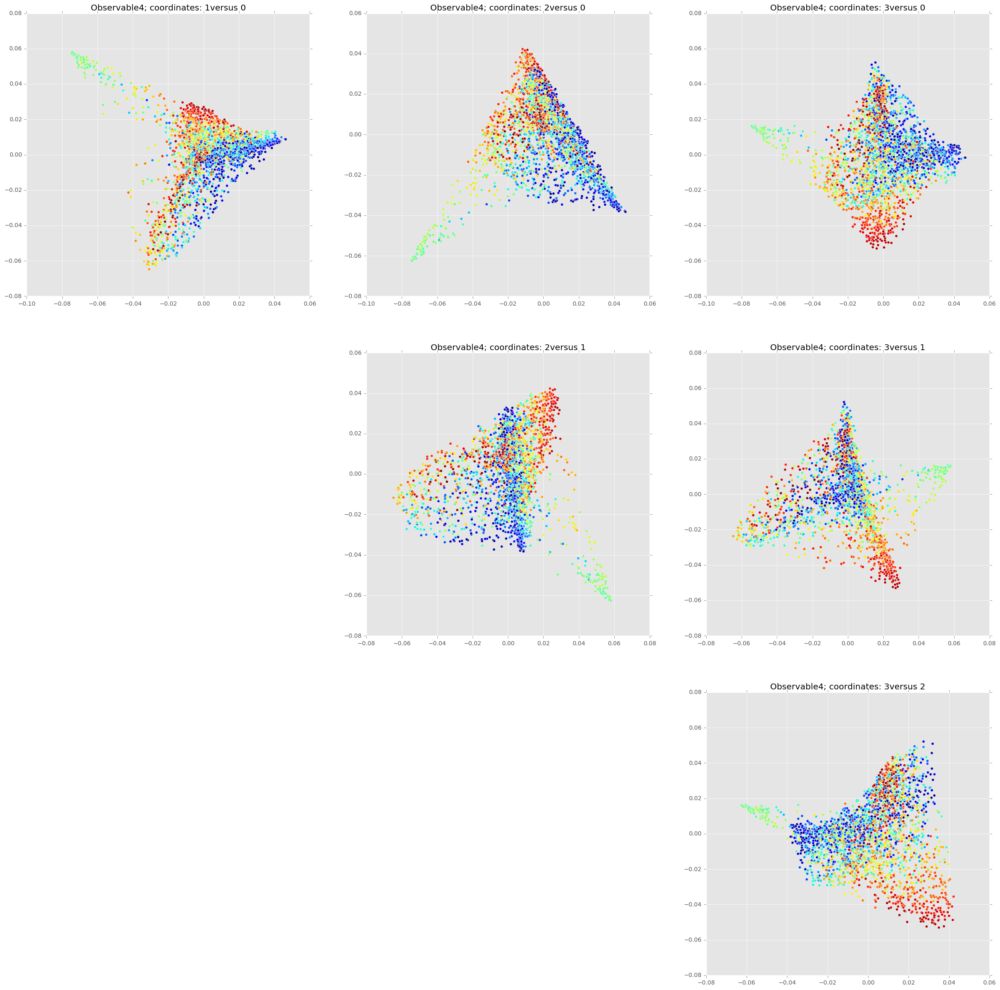

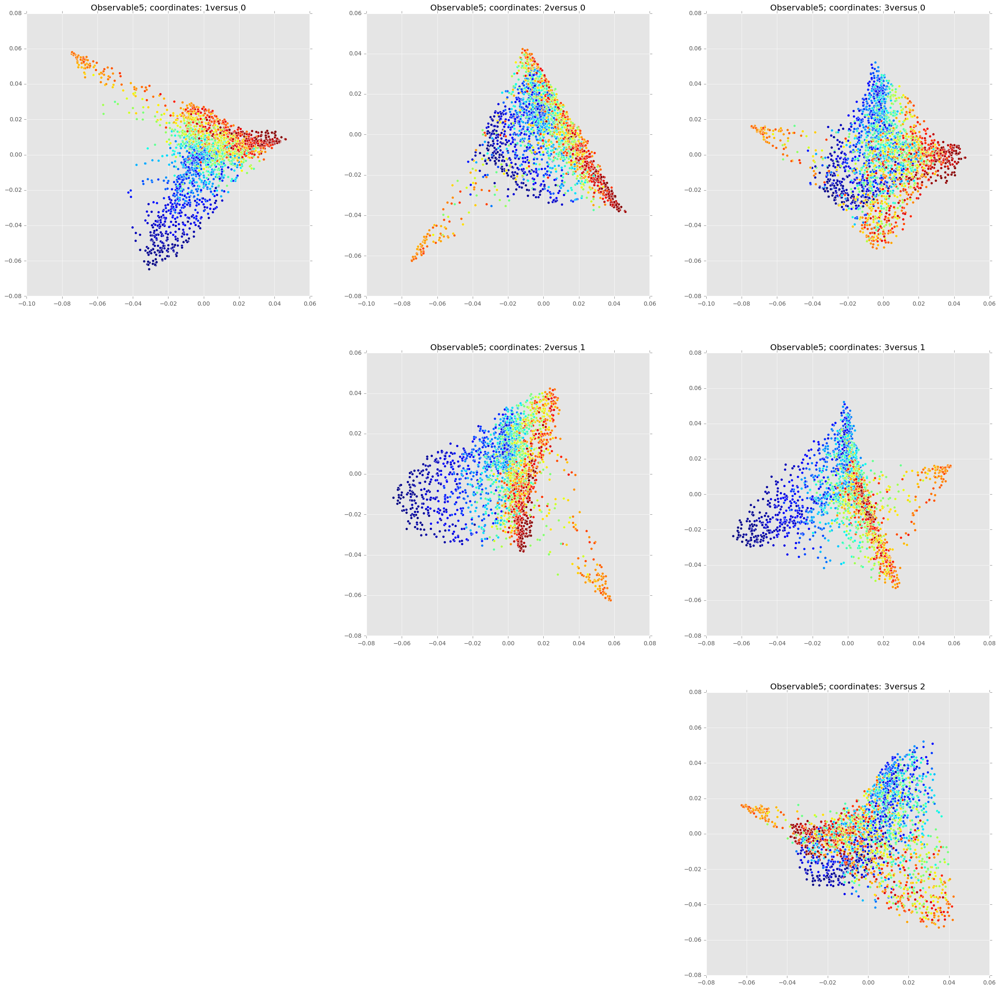

In [21]:
model.plot_diffusion_v_diffusion()

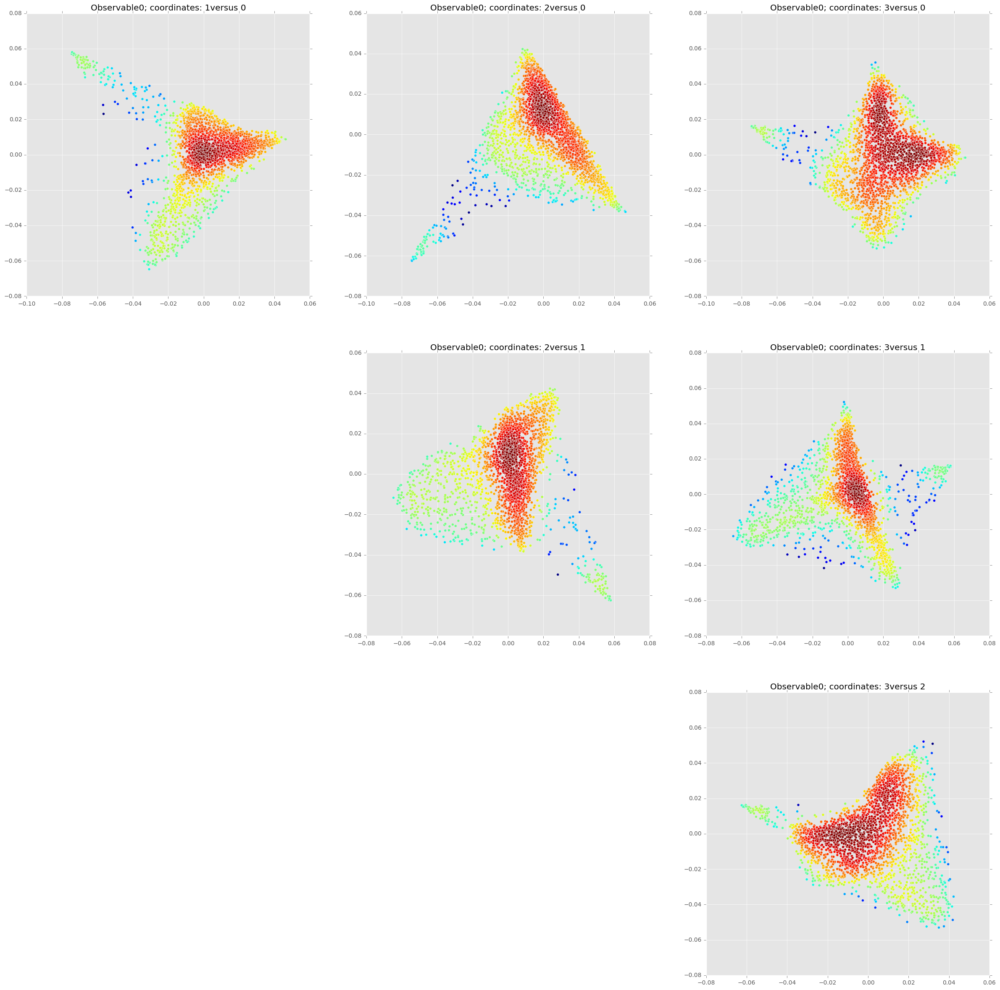

In [22]:
model.plot_diffusion_v_diffusion(color = 'density')

In [23]:
# model.plot_obs_v_diffusion()

In [35]:
%matplotlib notebook

In [36]:
model.obs_indices = [0]

<IPython.core.display.Javascript object>


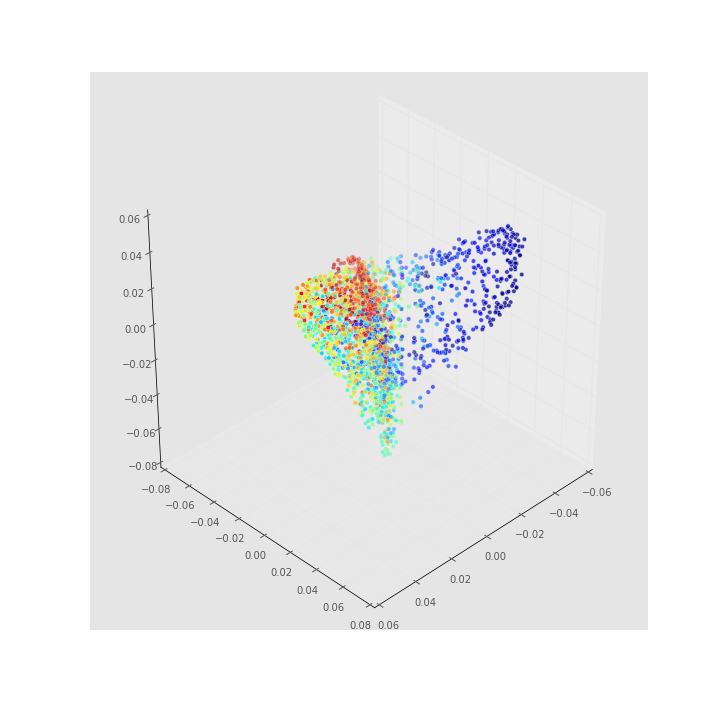

In [37]:
model.plot_diffusion_3d(coords=[0,1,2])

In [33]:
builder = build_markov.markov_model_builder(model)

In [13]:
builder.build_model(n_clusters=13,n_iter=100,random_state=1,covariance_type='full',coords_indices_to_use = range(4))

/Users/gil/anaconda/envs/python_3_env/lib/python3.5/site-packages/sklearn/utils/deprecation.py:70: DeprecationWarning: Function distribute_covar_matrix_to_match_covariance_type is deprecated; The functon distribute_covar_matrix_to_match_covariance_typeis deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/Users/gil/.local/lib/python3.5/site-packages/hmmlearn/base.py:429: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  framelogprob = self._compute_log_likelihood(X[i:j])
/Users/gil/anaconda/envs/python_3_env/lib/python3.5/site-packages/sklearn/utils/deprecation.py:70: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/Users/gil/.local/lib/python3.5/site-packages/hmmlearn/base.py:435: VisibleDeprecationWarn

converged True


/Users/gil/anaconda/envs/python_3_env/lib/python3.5/site-packages/sklearn/utils/deprecation.py:70: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/Users/gil/.local/lib/python3.5/site-packages/hmmlearn/base.py:451: RuntimeWarning: divide by zero encountered in log
  n_samples, n_components, np.log(self.startprob_),
/Users/gil/.local/lib/python3.5/site-packages/hmmlearn/base.py:452: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_), framelogprob)


In [14]:
builder.save()

In [15]:
builder.load()

In [16]:
# reload(build_markov)
# builder2 = build_markov.markov_model_builder(model)
# builder2reload(build_markov)
# builder2 = build_markov.markov_model_builder(model).build_model(n_clusters=5,n_iter=1000,tol = 1e-4,random_state=1,covariance_type='full')
# builder2.status

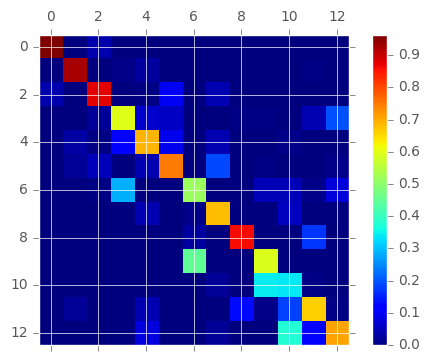

In [17]:
builder.plot_transition_matrix(obs_index = 0)

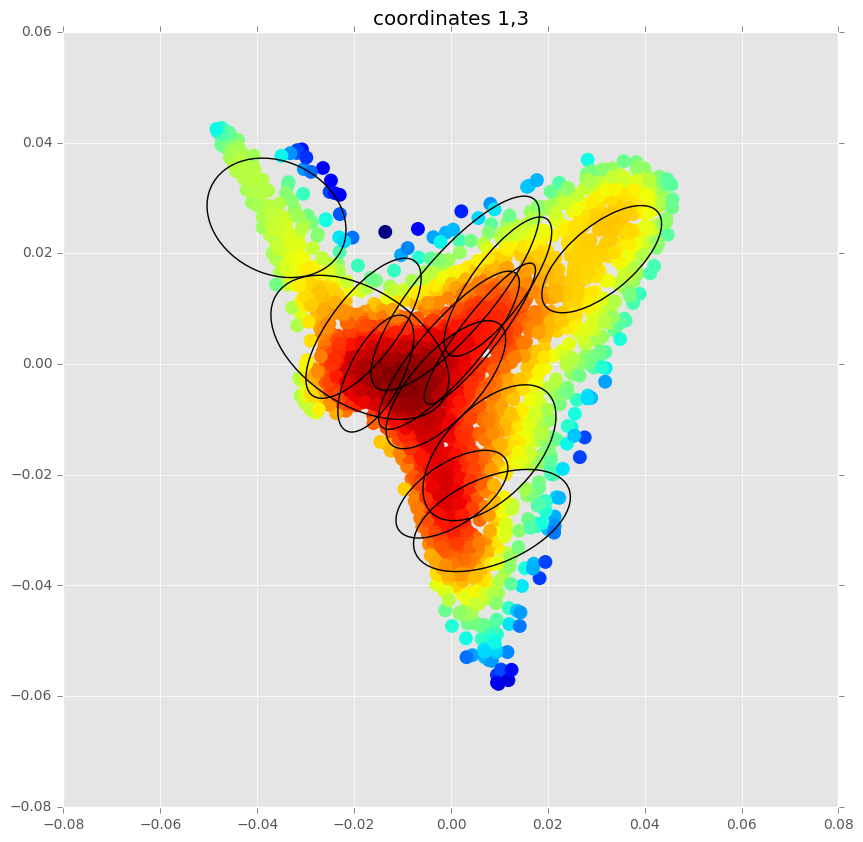

In [18]:
builder.ellipses_plot(indices=[0,2])

In [19]:
# builder.build_model(n_clusters=2000,method='agg_clustering')

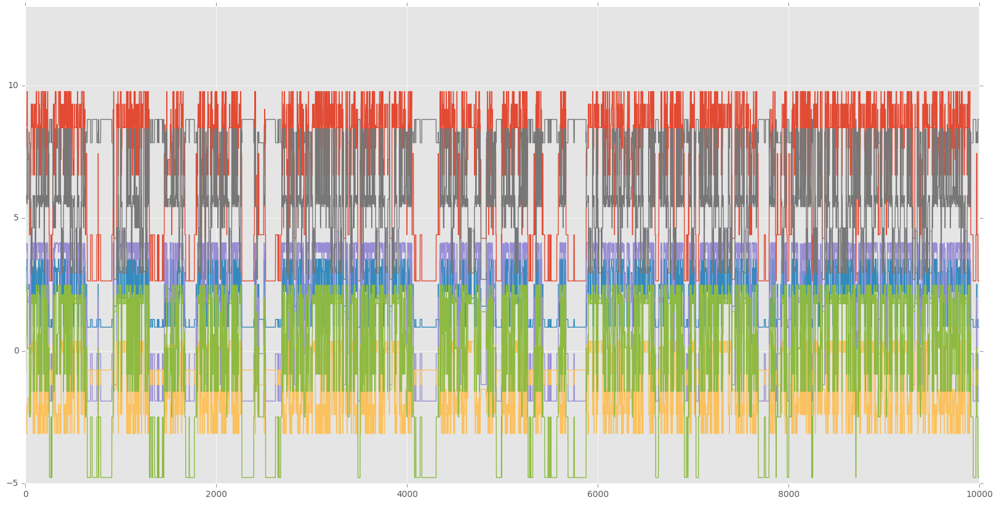

In [20]:
plt.figure(figsize=(20,10))
plt.plot(np.asarray(builder.generate_obs_traj(10000,random_state=2)).T);
plt.ylim(-5,13);

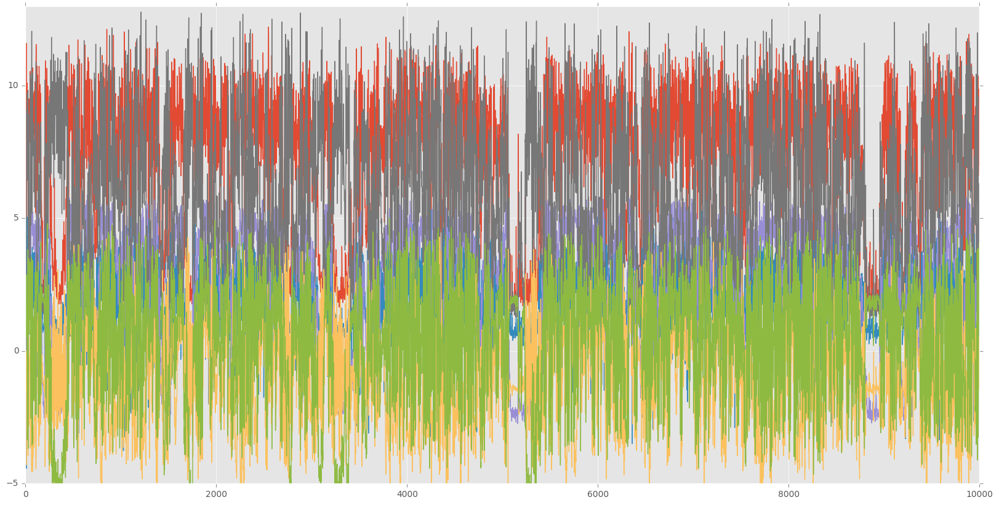

In [21]:
plt.figure(figsize=(20,10))
plt.plot(model.traj_expects.T[:10000]);
plt.ylim(-5,13);